In [6]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
# check on required dependencies 
import torch
import torchvision
print(torch.__version__, torchvision.__version__)

2.7.0.dev20250127+cu124 0.22.0.dev20250127+cu124


# Background

[Paper here]("https://scontent.fboi1-1.fna.fbcdn.net/v/t39.2365-6/10000000_900554171201033_1602411987825904100_n.pdf?_nc_cat=100&ccb=1-7&_nc_sid=3c67a6&_nc_ohc=mbPnj4_E3owQ7kNvgHn-M3W&_nc_zt=14&_nc_ht=scontent.fboi1-1.fna&_nc_gid=AJ4jB8rEWuSagTuvVCZR8fx&oh=00_AYADhsVEqvkrgwShFgUkNhPTEd5FzsFN_pA84St1cYH_Ww&oe=67A6C427")



Since SAM can efficiently process prompts, masks for the entire image can be generated by sampling a large number of prompts over an image. This method was used to generate the dataset SA-1B.

The class SamAutomaticMaskGenerator implements this capability. It works by sampling single-point input prompts in a grid over the image, from each of which SAM can predict multiple masks. Then, masks are filtered for quality and deduplicated using non-maximal suppression. Additional options allow for further improvement of mask quality and quantity, such as running prediction on multiple crops of the image or postprocessing masks to remove small disconnected regions and holes.


## Docstring


This function, show_anns(anns), is used to visualize segmentations (masks) on an image. Here's a breakdown of what it does in plain English:

    Check if there are any annotations
        If the input list anns (annotations) is empty, the function returns immediately without doing anything.

    Sort the annotations by area (largest first)
        It sorts the list anns in descending order based on the 'area' field. This ensures that larger segments are drawn first, preventing smaller ones from being covered.

    Get the current plot axis (ax) and turn off autoscaling
        plt.gca() gets the current axis in Matplotlib.
        ax.set_autoscale_on(False) prevents the axis from automatically resizing when new elements are added.

    Create a blank RGBA image to overlay segmentations
        It initializes an image (img) filled with ones, matching the height and width of the first segmentation mask.
        The last channel (alpha or transparency) is set to 0, making the entire overlay initially transparent.

    Loop through each annotation and apply a color mask
        For each annotation (ann):
            m = ann['segmentation'] extracts the segmentation mask.
            A random RGB color with 35% transparency ([0.35] alpha) is generated.
            The mask is applied to the corresponding pixels in img.

    Display the overlaid image on the plot
        ax.imshow(img) overlays the modified image on the current Matplotlib plot.



In [7]:
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]]) #np.array([0.5, 0, 1, 0.35])
        img[m] = color_mask
    ax.imshow(img)

# Display the image

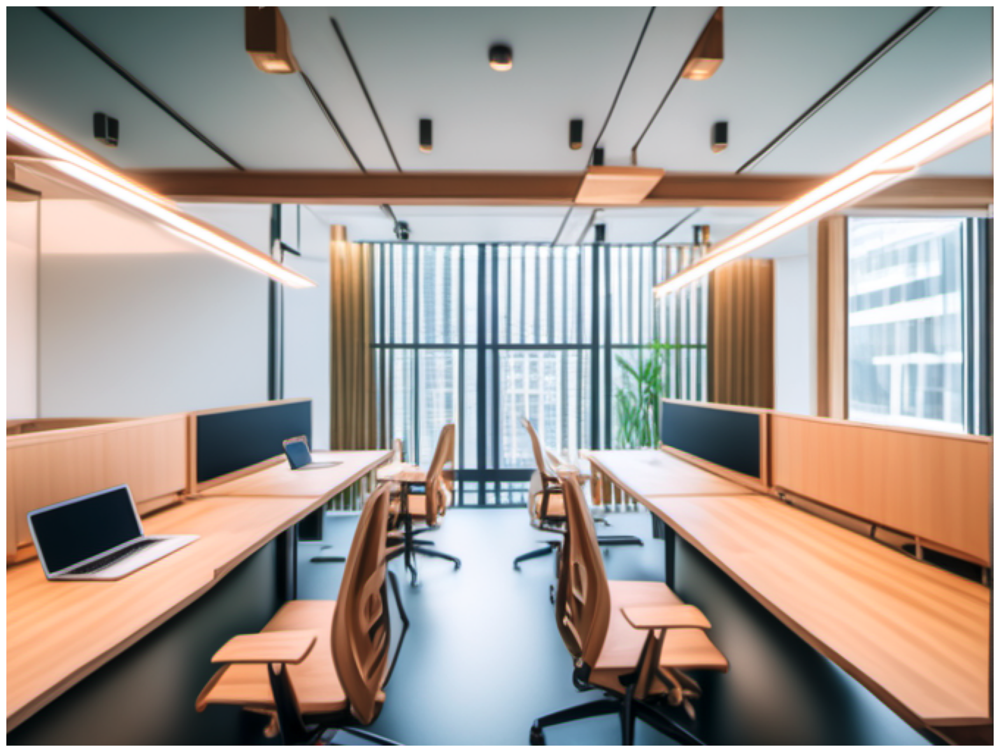

In [8]:
image = cv2.imread('/home/ubuntu/ComfyUI/input/sample_sam.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,20))
plt.imshow(image)
plt.axis('off')
plt.show()

# Generate the masks automatically, without a particular prompt

In [9]:
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam_checkpoint = "/home/ubuntu/sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
print('here a')
sam.to(device=device)
print('here b') 
mask_generator = SamAutomaticMaskGenerator(sam)

here a
here b


In [10]:
masks = mask_generator.generate(image)
print(len(masks))
print(masks[0].keys())

102
dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


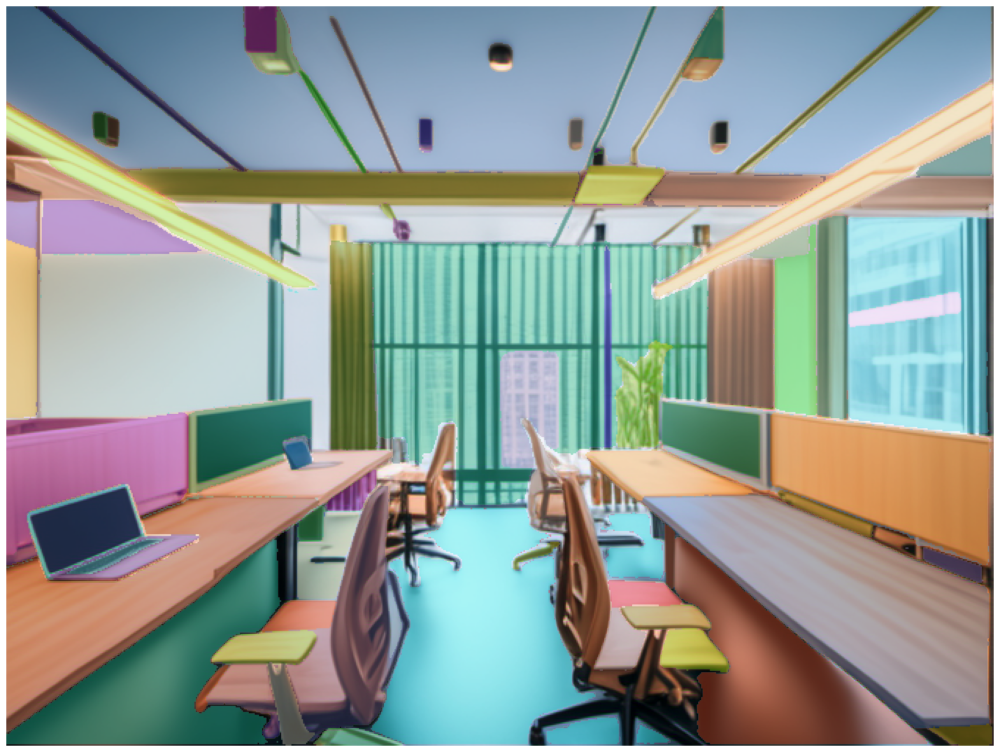

In [11]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

<Axes: >

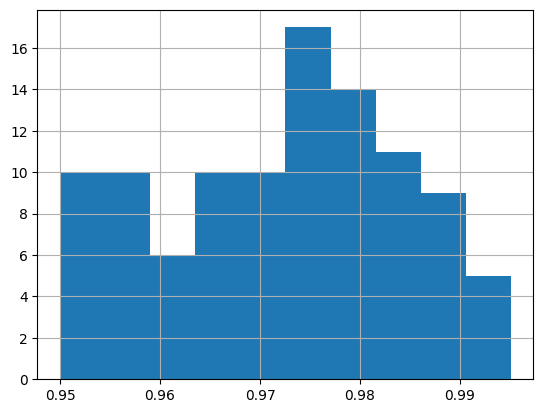

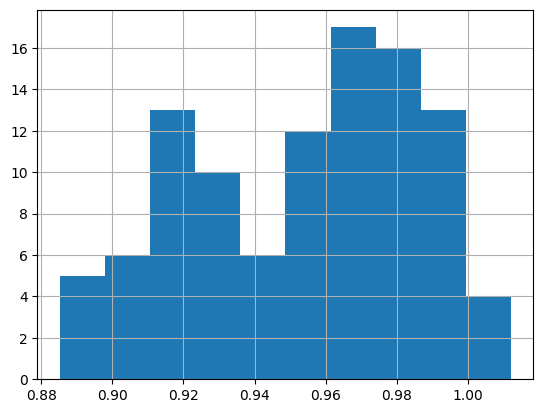

In [17]:
import pandas as pd
pd.Series([masks[i]['stability_score'] for i in range(len(masks))]).hist()
plt.figure()
pd.Series([masks[i]['predicted_iou'] for i in range(len(masks))]).hist()

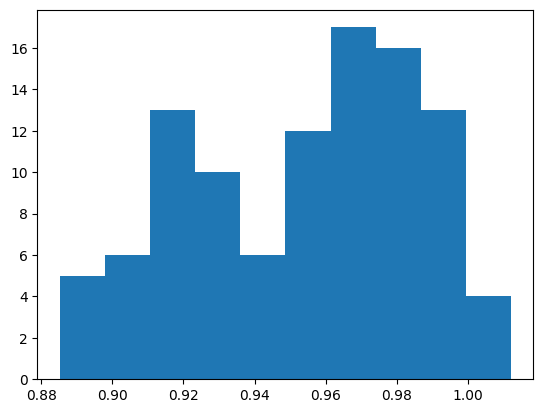

In [24]:
from matplotlib import patches
n, bins, patches = plt.hist([masks[i]['predicted_iou'] for i in range(len(masks))], bins=10)


In [42]:
iou_bin_assignments = [np.digitize(masks[i]['predicted_iou'],bins) for i in range(len(masks))]

In [46]:
masks[i]['predicted_iou']

0.9921069145202637

In [50]:
for i, b in enumerate(masks):
    b.update({'iou_bin':iou_bin_assignments[i]})

In [84]:
# def show_anns2(anns):
#     if len(anns) == 0:
#         return
#     sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
#     ax = plt.gca()
#     ax.set_autoscale_on(False)

#     img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
#     img[:,:,3] = 0
#     for ann in sorted_anns:
#         m = ann['segmentation']
#         color_mask = np.concatenate([np.array([0.5, 0, 1]), [0.5]]) #)
#         img[m] = color_mask
#     ax.imshow(img)


def show_anns2(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0  # Initialize alpha channel to 0 (fully transparent)

    for ann in sorted_anns:
        m = ann['segmentation']
        # Use bright purple (RGB: 0.5, 0, 1) and set alpha to 0.35
        color_mask = np.concatenate([np.array([0.5, 0, 1]), [0.5]])
        img[m] = color_mask  # Assign color to corresponding segment in the image

        # Get the label from the dictionary, assuming the key for label is 'label'
        label = round(ann.get('stability_score', 'No Label'),3) # Default to 'No Label' if not present
        # Find the coordinates for placing the label (center of the mask)
        center_y, center_x = np.argwhere(m).mean(axis=0)  # Calculate center of the mask
        
        # Add text label at the center of the segment
        ax.text(center_x, center_y, label, color='white', fontsize=8, ha='center', va='center')

    ax.imshow(img)  # Display the image with the applied masks


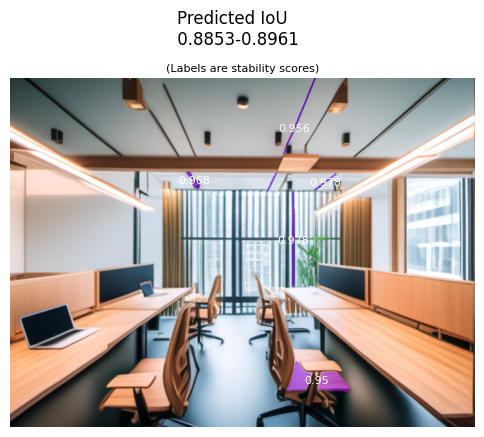

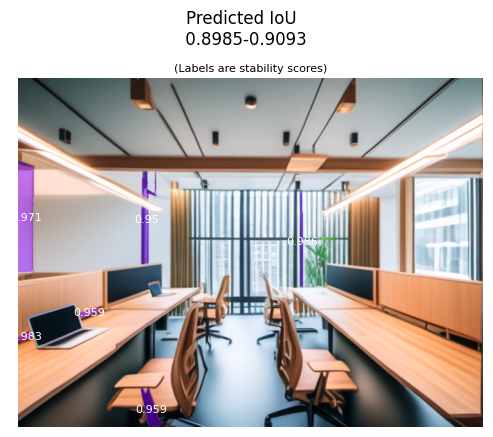

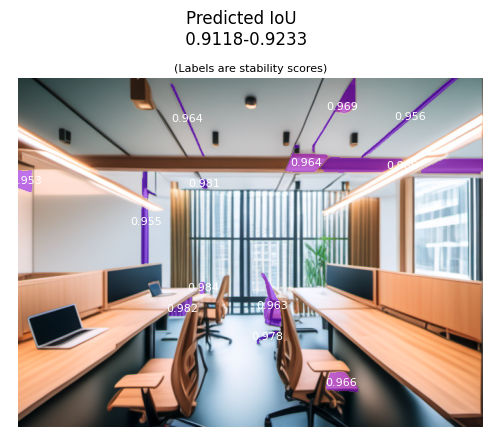

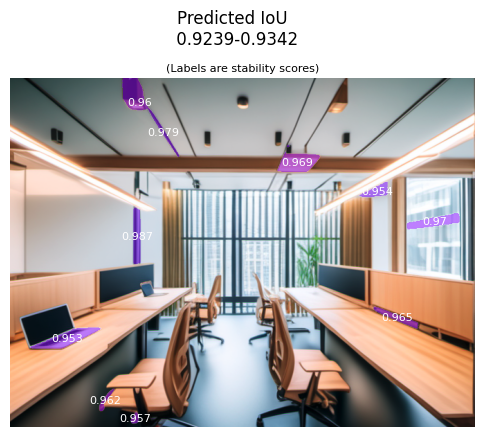

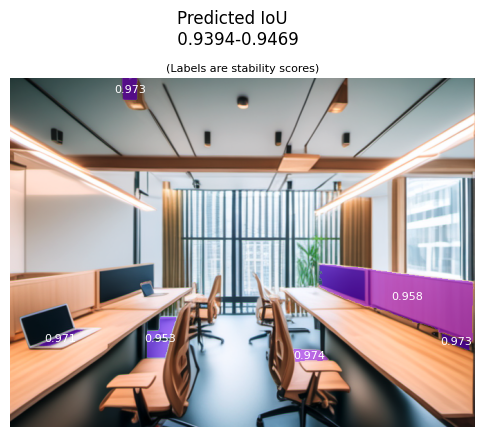

...

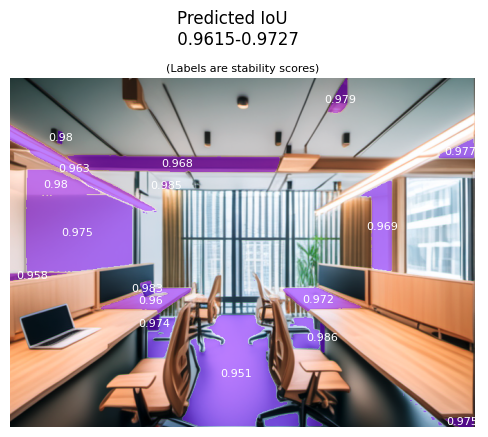

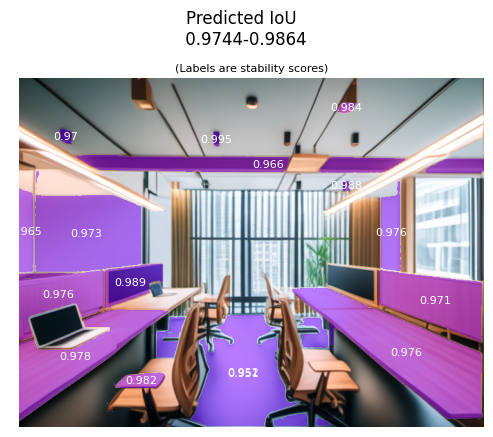

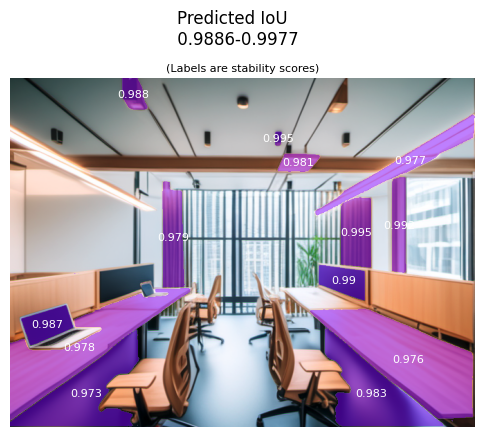

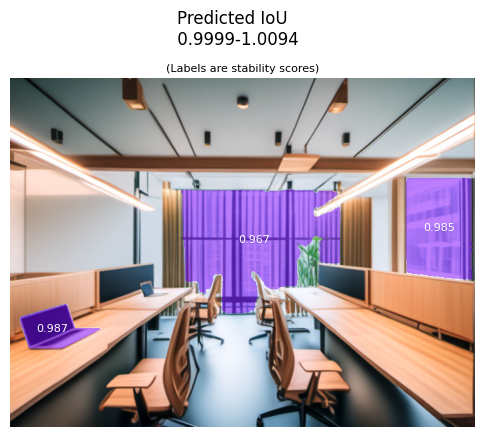

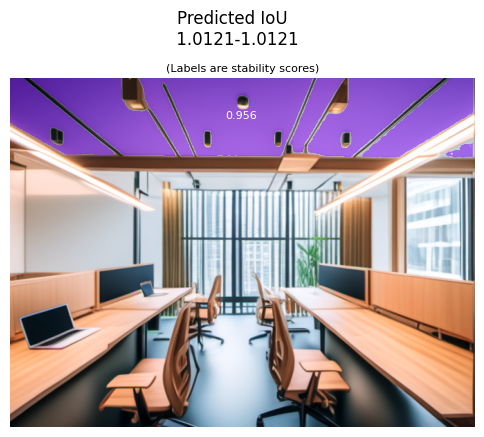

In [95]:
for i in np.arange(1,12):
    segs = [mask for mask in masks if mask["iou_bin"] == i]
    min_iou= np.min([segs[i]['predicted_iou'] for i in range(len(segs))])
    max_iou= np.max([segs[i]['predicted_iou'] for i in range(len(segs))])
    plt.figure(figsize=(6,6))
    plt.imshow(image)
    show_anns2(segs)
    plt.axis('off')
    plt.suptitle('Predicted IoU \n {:.4f}-{:.4f}'.format(min_iou,max_iou), y=.9)
    plt.title("(Labels are stability scores)", fontsize=8, pad=5)

    plt.show()
    

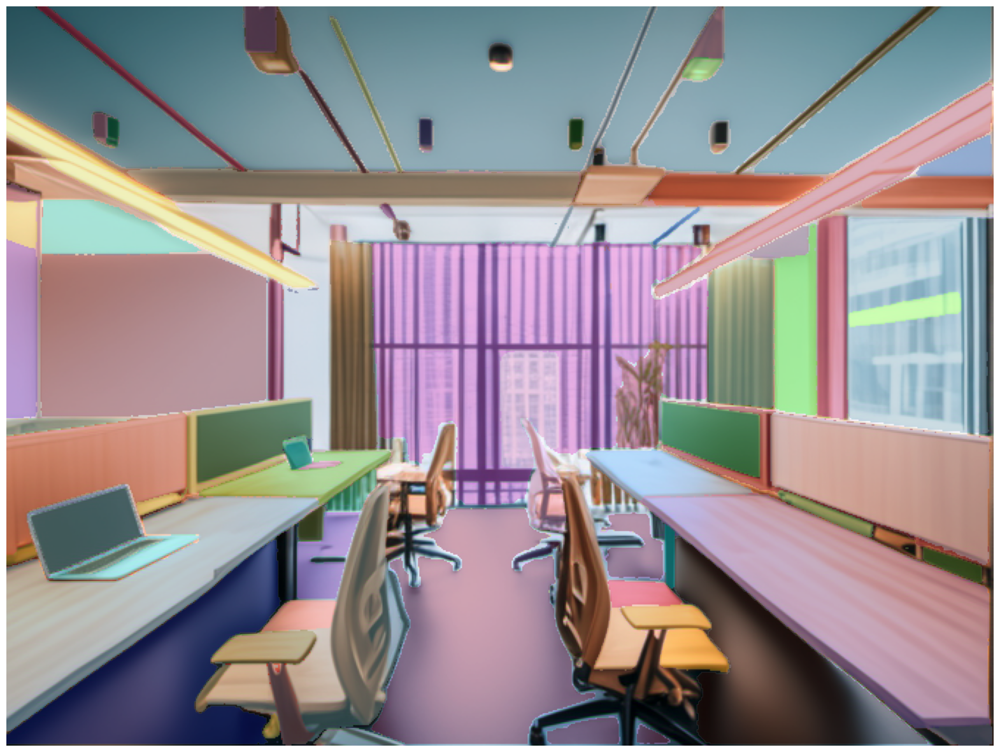

In [60]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 